In [1]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import os
from library.sb_utils import save_file
from pathlib import Path
import requests
import numpy as np
import pandas as pd
import pandas_profiling
from pandas_profiling.utils.cache import cache_file

In [2]:
from sklearn.datasets import load_boston
import pandas as pd
boston= load_boston()

In [3]:
boston.keys()

dict_keys(['data', 'target', 'feature_names', 'DESCR', 'filename'])

In [10]:
#Looking at the data shape
boston.data.shape

(506, 13)

In [11]:
 #Print column names
print(boston.feature_names)

['CRIM' 'ZN' 'INDUS' 'CHAS' 'NOX' 'RM' 'AGE' 'DIS' 'RAD' 'TAX' 'PTRATIO'
 'B' 'LSTAT']


In [12]:
feature_names=['CRIM' 'ZN' 'INDUS' 'CHAS' 'NOX' 'RM' 'AGE' 'DIS' 'RAD' 'TAX' 'PTRATIO'
 'B' 'LSTAT']

In [7]:
# Print description of Boston housing data set
print(boston.DESCR)

.. _boston_dataset:

Boston house prices dataset
---------------------------

**Data Set Characteristics:**  

    :Number of Instances: 506 

    :Number of Attributes: 13 numeric/categorical predictive. Median Value (attribute 14) is usually the target.

    :Attribute Information (in order):
        - CRIM     per capita crime rate by town
        - ZN       proportion of residential land zoned for lots over 25,000 sq.ft.
        - INDUS    proportion of non-retail business acres per town
        - CHAS     Charles River dummy variable (= 1 if tract bounds river; 0 otherwise)
        - NOX      nitric oxides concentration (parts per 10 million)
        - RM       average number of rooms per dwelling
        - AGE      proportion of owner-occupied units built prior to 1940
        - DIS      weighted distances to five Boston employment centres
        - RAD      index of accessibility to radial highways
        - TAX      full-value property-tax rate per $10,000
        - PTRATIO  pu

In [19]:
boston.info()

AttributeError: info

In [16]:
bosdf= pd.DataFrame(boston.data)
bosdf.head()

,0,1,2,3,4,5,6,7,8,9,10,11,12
0,0.00632,18.0,2.31,0.0,0.538,6.575,65.2,4.0900,1.0,296.0,15.3,396.90,4.98
1,0.02731,0.0,7.07,0.0,0.469,6.421,78.9,4.9671,2.0,242.0,17.8,396.90,9.14
2,0.02729,0.0,7.07,0.0,0.469,7.185,61.1,4.9671,2.0,242.0,17.8,392.83,4.03
3,0.03237,0.0,2.18,0.0,0.458,6.998,45.8,6.0622,3.0,222.0,18.7,394.63,2.94
4,0.06905,0.0,2.18,0.0,0.458,7.147,54.2,6.0622,3.0,222.0,18.7,396.90,5.33


In [17]:
#There are no column nanes, lets add those 
bosdf.columns = boston.feature_names
bosdf.head()

,CRIM,ZN,INDUS,CHAS,NOX,RM,AGE,DIS,RAD,TAX,PTRATIO,B,LSTAT
0,0.00632,18.0,2.31,0.0,0.538,6.575,65.2,4.0900,1.0,296.0,15.3,396.90,4.98
1,0.02731,0.0,7.07,0.0,0.469,6.421,78.9,4.9671,2.0,242.0,17.8,396.90,9.14
2,0.02729,0.0,7.07,0.0,0.469,7.185,61.1,4.9671,2.0,242.0,17.8,392.83,4.03
3,0.03237,0.0,2.18,0.0,0.458,6.998,45.8,6.0622,3.0,222.0,18.7,394.63,2.94
4,0.06905,0.0,2.18,0.0,0.458,7.147,54.2,6.0622,3.0,222.0,18.7,396.90,5.33


In [20]:
#Median Value(MEDV) attribute 14 the target is not included in this table. Its stored in target data
print(boston.target.shape)

(506,)


In [21]:
bosdf['MEDV'] = boston.target
bosdf.head()
bosdf.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 506 entries, 0 to 505
Data columns (total 14 columns):
 #   Column   Non-Null Count  Dtype  
---  ------   --------------  -----  
 0   CRIM     506 non-null    float64
 1   ZN       506 non-null    float64
 2   INDUS    506 non-null    float64
 3   CHAS     506 non-null    float64
 4   NOX      506 non-null    float64
 5   RM       506 non-null    float64
 6   AGE      506 non-null    float64
 7   DIS      506 non-null    float64
 8   RAD      506 non-null    float64
 9   TAX      506 non-null    float64
 10  PTRATIO  506 non-null    float64
 11  B        506 non-null    float64
 12  LSTAT    506 non-null    float64
 13  MEDV     506 non-null    float64
dtypes: float64(14)
memory usage: 55.5 KB


In [22]:
#Calling the head method on ski_data to print the first several rows of the data, 
#we will transpose the output using .T; where T stands for transpose
bosdf.head().T

,0,1,2,3,4
CRIM,0.00632,0.02731,0.02729,0.03237,0.06905
ZN,18.00000,0.00000,0.00000,0.00000,0.00000
INDUS,2.31000,7.07000,7.07000,2.18000,2.18000
CHAS,0.00000,0.00000,0.00000,0.00000,0.00000
NOX,0.53800,0.46900,0.46900,0.45800,0.45800
RM,6.57500,6.42100,7.18500,6.99800,7.14700
AGE,65.20000,78.90000,61.10000,45.80000,54.20000
DIS,4.09000,4.96710,4.96710,6.06220,6.06220
RAD,1.00000,2.00000,2.00000,3.00000,3.00000
TAX,296.00000,242.00000,242.00000,222.00000,222.00000


In [23]:
#lets call the  describe() to look at the basic summary statistics for all variable/columns.
bosdf.describe()

,CRIM,ZN,INDUS,CHAS,NOX,RM,AGE,DIS,RAD,TAX,PTRATIO,B,LSTAT,MEDV
count,506.000000,506.000000,506.000000,506.000000,506.000000,506.000000,506.000000,506.000000,506.000000,506.000000,506.000000,506.000000,506.000000,506.000000
mean,3.613524,11.363636,11.136779,0.069170,0.554695,6.284634,68.574901,3.795043,9.549407,408.237154,18.455534,356.674032,12.653063,22.532806
std,8.601545,23.322453,6.860353,0.253994,0.115878,0.702617,28.148861,2.105710,8.707259,168.537116,2.164946,91.294864,7.141062,9.197104
min,0.006320,0.000000,0.460000,0.000000,0.385000,3.561000,2.900000,1.129600,1.000000,187.000000,12.600000,0.320000,1.730000,5.000000
25%,0.082045,0.000000,5.190000,0.000000,0.449000,5.885500,45.025000,2.100175,4.000000,279.000000,17.400000,375.377500,6.950000,17.025000
50%,0.256510,0.000000,9.690000,0.000000,0.538000,6.208500,77.500000,3.207450,5.000000,330.000000,19.050000,391.440000,11.360000,21.200000
75%,3.677083,12.500000,18.100000,0.000000,0.624000,6.623500,94.075000,5.188425,24.000000,666.000000,20.200000,396.225000,16.955000,25.000000
max,88.976200,100.000000,27.740000,1.000000,0.871000,8.780000,100.000000,12.126500,24.000000,711.000000,22.000000,396.900000,37.970000,50.000000


In [24]:
#Even betteer let's exploring data with profile_report that give not just text of means but a graphical description of data  
dashboard = bosdf.profile_report(sort='None', html={'style':{'full_width': True}}, progress_bar=False)
dashboard

Profilling shows that there are no missing values, 
#but ZN, proportion of residential land zoned for lots over 25,000 sq.ft has some zeros. 
I guess we can treat them as zeros 

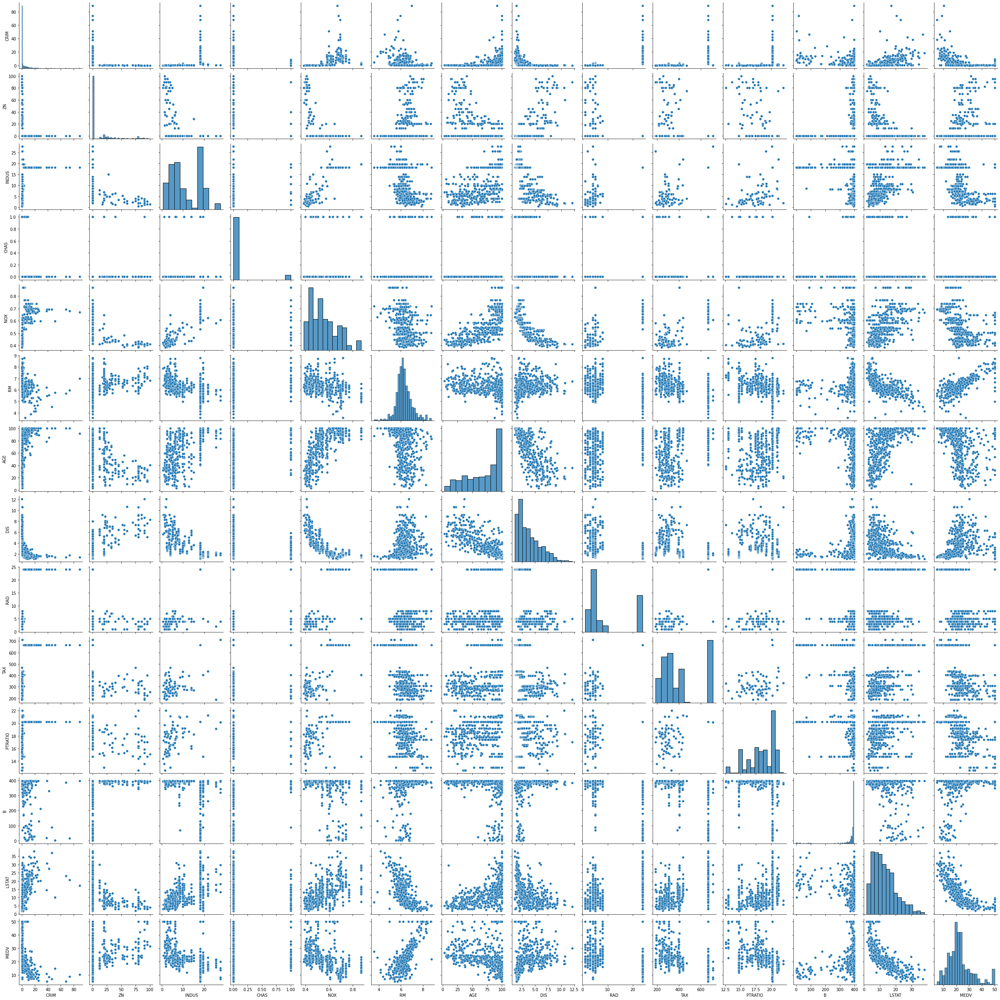

In [77]:
#Let's look at the correlation matrix to infer the relationship between every varaible in a grid plot using sns.pairplot() method
sns.pairplot(bosdf)

In [25]:
# There are no missing values but lets try another method of finding the null values.
bosdf.isnull().sum()

CRIM       0
ZN         0
INDUS      0
CHAS       0
NOX        0
RM         0
AGE        0
DIS        0
RAD        0
TAX        0
PTRATIO    0
B          0
LSTAT      0
MEDV       0
dtype: int64

#CRIM and MEDV are negetively correlated though skewed towards the left. 
#other parameters like RM and MEDV positively correlates and that makes sense.
#MEDV and LSAT are negative pals. 
#It looks as the proportion of population that is lower status increases price of house depreciates 
#PTRATIO and MEDV show no real correlation

Text(0.5, 1.0, "Relationship between CRIM and Median value of owner-occupied homes in $1000's")

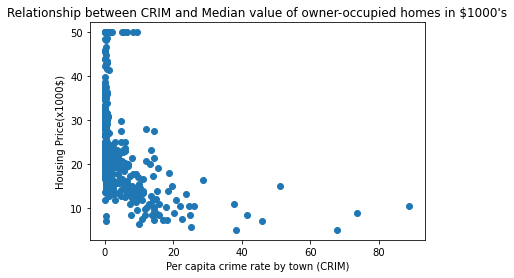

In [26]:
#Lets plot some of the interesting correlations.
plt.scatter(bosdf.CRIM, bosdf.MEDV)
plt.xlabel("Per capita crime rate by town (CRIM)")
plt.ylabel("Housing Price(x1000$)")
plt.title("Relationship between CRIM and Median value of owner-occupied homes in $1000's")

<AxesSubplot:xlabel='CRIM', ylabel='MEDV'>

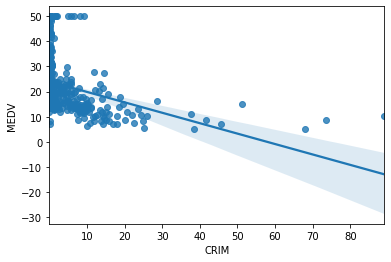

In [27]:
#Make the same plot wit
sns.regplot(y="MEDV", x="CRIM", data=bosdf, fit_reg = True)

Text(0.5, 1.0, 'Relationship between PTRATIO and Price')

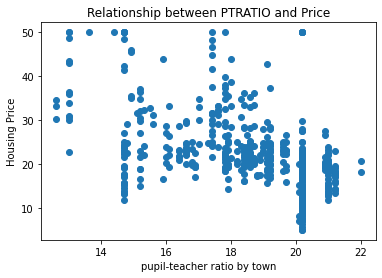

In [28]:
#scatter plot between *PTRATIO* and *MEDV*
plt.scatter(bosdf.PTRATIO, bosdf.MEDV)
plt.xlabel("pupil-teacher ratio by town")
plt.ylabel("Housing Price")
plt.title("Relationship between PTRATIO and Price")

<AxesSubplot:xlabel='RM', ylabel='MEDV'>

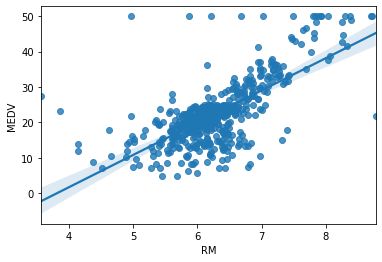

In [29]:
sns.regplot(y="MEDV", x="RM", data=bosdf, fit_reg = True)

Text(0.5, 1.0, 'Relationship between RM and Price')

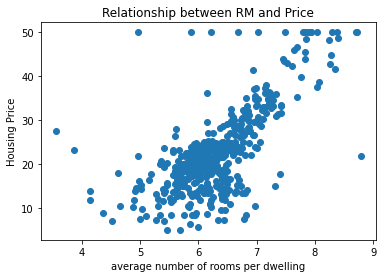

In [37]:
#scatter plot between *RM* and *MEDV*
plt.scatter(bosdf.RM, bosdf.MEDV)
plt.xlabel("average number of rooms per dwelling")
plt.ylabel("Housing Price")
plt.title("Relationship between RM and Price")

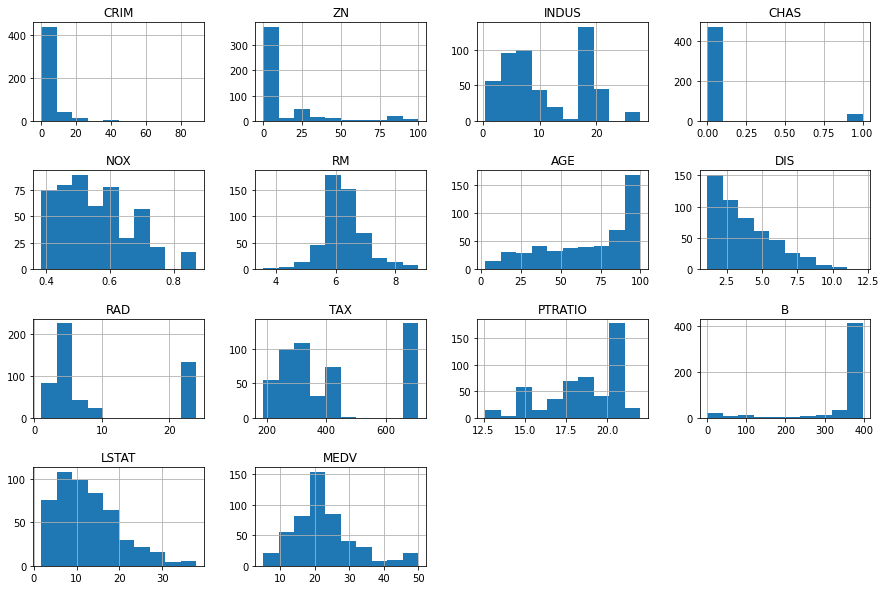

In [32]:
#plot histogram for all variables with plt.subplots_adjust()
bosdf.hist(figsize=(15,10))
plt.subplots_adjust(hspace=0.5);

Price seems to be evenly distributed

<AxesSubplot:>

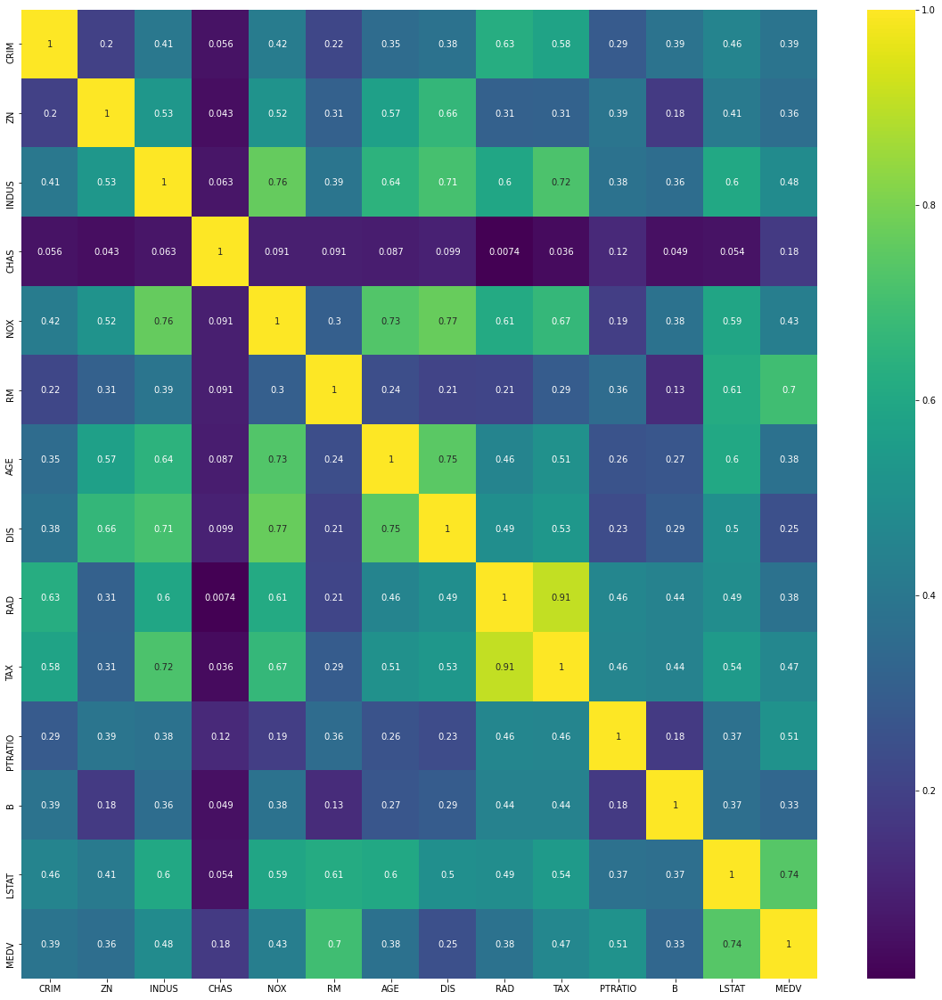

In [35]:
plt.figure(figsize=(20, 20))
sns.heatmap(bosdf.corr().abs(),cmap='viridis',annot=True)
#plt.subplots(figsize=(12,10))
#sns.heatmap(bosdf.corr())

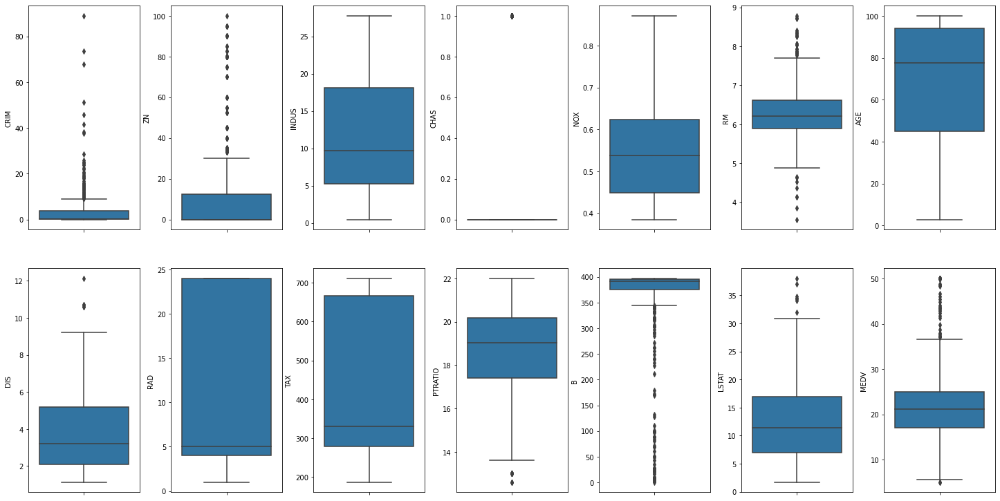

In [40]:

fig, axs = plt.subplots(ncols=7, nrows=2, figsize=(20, 10))
index = 0
axs = axs.flatten()
for k,v in bosdf.items():
    sns.boxplot(y=k, data=bosdf, ax=axs[index])
    index += 1
plt.tight_layout(pad=0.4, w_pad=0.5, h_pad=5.0)

Columns like CRIM, ZN, RM, B seems to have outliers. Let's see the outliers percentage in every column.

In [41]:
#Checking for the % of ourliers 
for k, v in bosdf.items():
        k1 = v.quantile(0.25)
        k3 = v.quantile(0.75)
        irq = k3 - k1
        v_col = v[(v <= k1 - 1.5 * irq) | (v >= k3 + 1.5 * irq)]
        perc = np.shape(v_col)[0] * 100.0 / np.shape(bosdf)[0]
        print("Column %s outliers = %.2f%%" % (k, perc))

Column CRIM outliers = 13.04%
Column ZN outliers = 13.44%
Column INDUS outliers = 0.00%
Column CHAS outliers = 100.00%
Column NOX outliers = 0.00%
Column RM outliers = 5.93%
Column AGE outliers = 0.00%
Column DIS outliers = 0.99%
Column RAD outliers = 0.00%
Column TAX outliers = 0.00%
Column PTRATIO outliers = 2.96%
Column B outliers = 15.22%
Column LSTAT outliers = 1.38%
Column MEDV outliers = 7.91%


In [43]:
#Remove outliers in MedV the dependant variable before  using it for prediction
#Let's remove MEDV outliers (MEDV = 50.0) before plotting more distributions
bosdf = bosdf[~(bosdf['MEDV'] >= 50.0)]
print(np.shape(bosdf))

(490, 14)


C:\Users\dzogl\anaconda3\lib\site-packages\seaborn\distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
C:\Users\dzogl\anaconda3\lib\site-packages\seaborn\distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
C:\Users\dzogl\anaconda3\lib\site-packages\seaborn\distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-lev

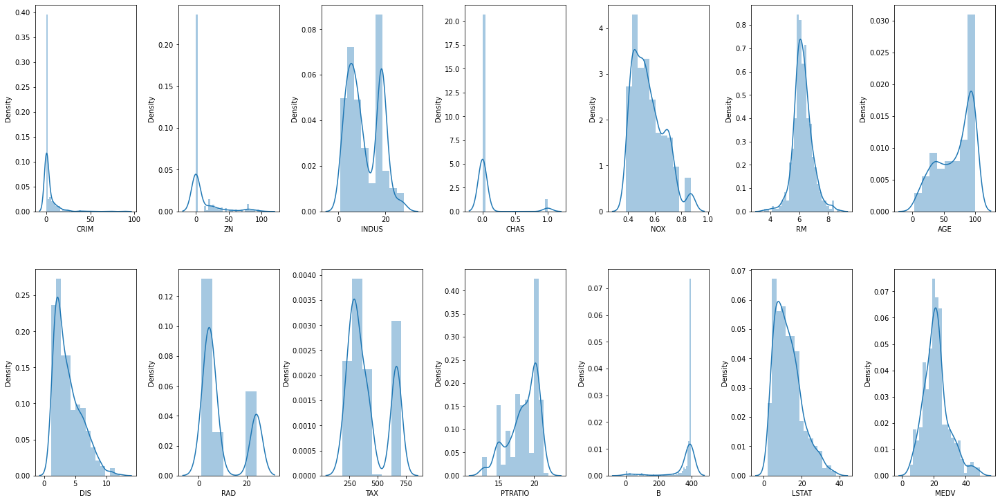

In [48]:
#looking at teh distrobution of the features
fig, axs = plt.subplots(ncols=7, nrows=2, figsize=(20, 10))
index = 0
axs = axs.flatten()
for k,v in bosdf.items():
    sns.distplot(v, ax=axs[index])
    index += 1
plt.tight_layout(pad=0.4, w_pad=0.5, h_pad=5.0)

In [ ]:
#CRIM, ZN, B has highly skewed distributions.
#Also MEDV looks to have a normal distribution (the predictions) and 
#other colums seem to have norma or bimodel ditribution of data except CHAS (which is a discrete variable).


<AxesSubplot:>

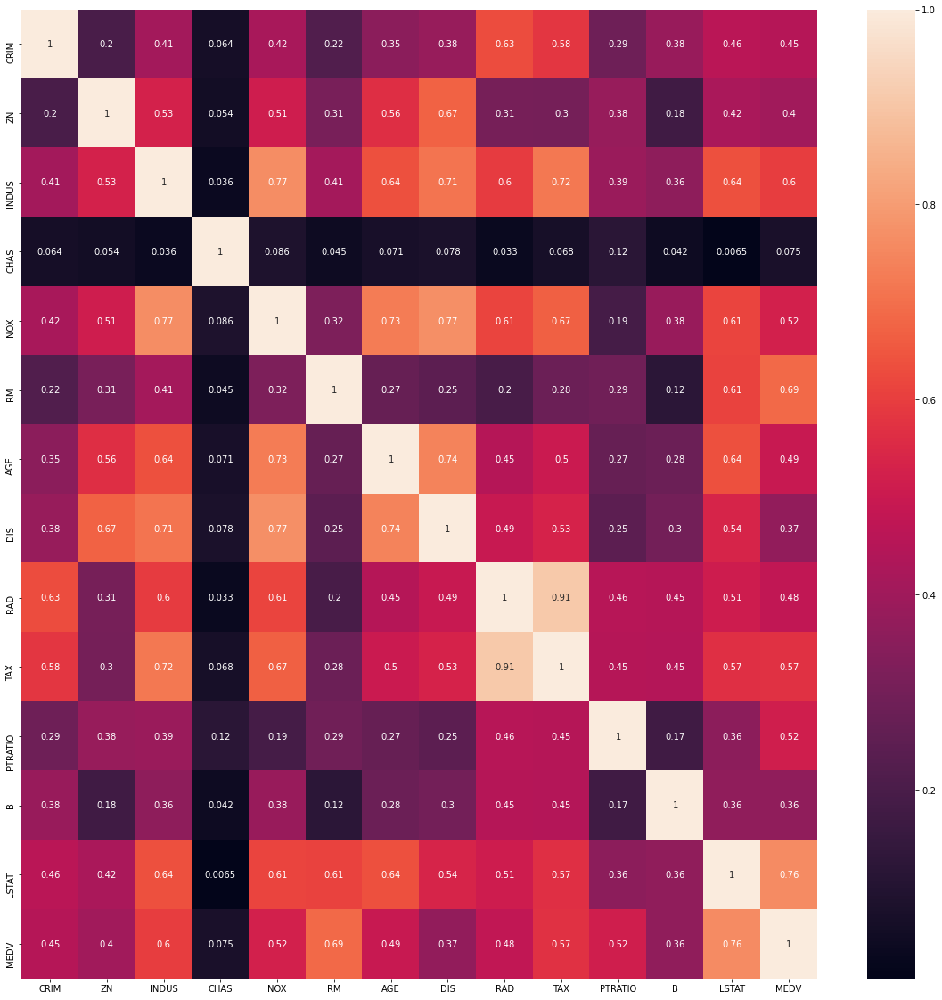

In [50]:
#plot another pairwise correlation on data
plt.figure(figsize=(20, 20))
sns.heatmap(bosdf.corr().abs(),  annot=True)

TAX and RAD are highly correlated features. The columns LSTAT, INDUS, RM, TAX, NOX, PTRAIO has a correlation score above 0.5 with MEDV. Good candidate as predictors.

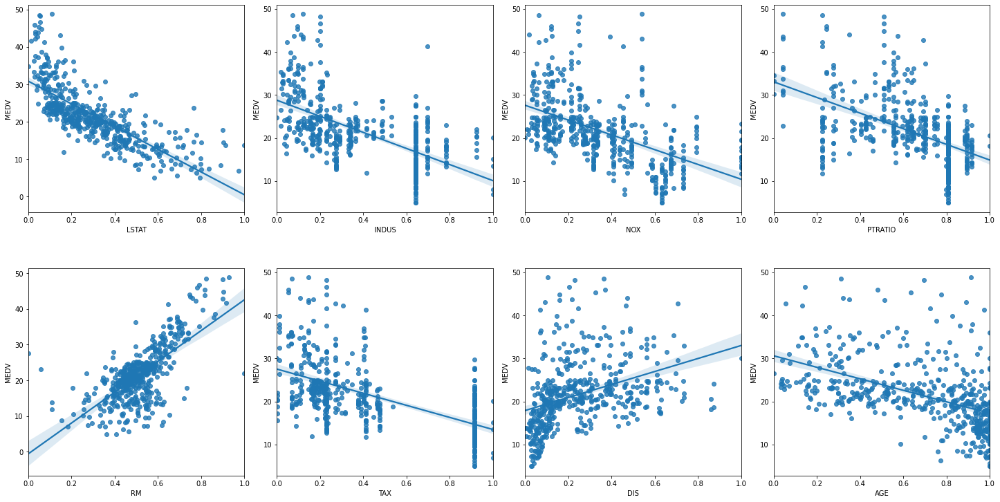

In [54]:
from sklearn import preprocessing
# Let's scale the columns before plotting them against MEDV
min_max_scaler = preprocessing.MinMaxScaler()
column_sels = ['LSTAT', 'INDUS', 'NOX', 'PTRATIO', 'RM', 'TAX', 'DIS', 'AGE']
x = bosdf.loc[:,column_sels]
y = bosdf['MEDV']
x = pd.DataFrame(data=min_max_scaler.fit_transform(x), columns=column_sels)
fig, axs = plt.subplots(ncols=4, nrows=2, figsize=(20, 10))
index = 0
axs = axs.flatten()
for i, k in enumerate(column_sels):
    sns.regplot(y=y, x=x[k], ax=axs[i])
plt.tight_layout(pad=0.4, w_pad=0.5, h_pad=5.0)

In [ ]:
#The above parameters will be selected as first candidates for model selection.